In [1]:
import numpy as np
import matplotlib
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
textsize = 'x-large'
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (6, 4),
         'axes.labelsize': textsize,
         'axes.titlesize': textsize,
         'xtick.labelsize': textsize,
         'ytick.labelsize': textsize,
         'figure.facecolor': 'w'}
pylab.rcParams.update(params)
from matplotlib import pyplot as plt

import h5py
import corner

%load_ext autoreload
%autoreload 2
import plotter
import emulator

### Load emulator

In [2]:
cosmo, hod = 3, 3
statistic = 'wp'
traintag = '_nonolap'
testtag = '_mean_test0'
errtag = '_100hod_test0'
kernel_name = 'M32ExpConst2'
nhod = 100
tag = '_log_kM32ExpConst2_{}hod'.format(nhod)

gptag = traintag + errtag + tag
res_dir = '../../clust/results_{}/'.format(statistic)
gperr = np.loadtxt(res_dir+"{}_error{}.dat".format(statistic, errtag))
training_dir = '{}training_{}{}/'.format(res_dir, statistic, traintag)
testing_dir = '{}testing_{}{}/'.format(res_dir, statistic, testtag)
hyperparams = "../training_results/{}_training_results{}.dat".format(statistic, gptag)

emu = emulator.Emulator(statistic, training_dir, gperr=gperr, hyperparams=hyperparams, nhod=nhod, kernel_name=kernel_name)
emu.build()

george version: 0.3.1
Loading training data
Nparams: 18
Rebuilding emulators


### Plotting code

In [3]:
def plot_chains(chaintag, show_walkers=False, show_corner=True): 
    #chaintag = 'wp_c3h3_Msat_fenv_xlong_diag'
    chain_fn = f'../chains/chains_{chaintag}.h5'
    fw = h5py.File(chain_fn, 'r')

    chain_dset = fw['chain']
    print(chain_dset)
    lnprob_dset = fw['lnprob']
    param_names = fw.attrs['param_names']
    true_values = fw.attrs['true_values']
    nwalkers, nchain, ndim = chain_dset.shape

    if show_walkers:
        for k in range(ndim):
            plt.figure()
            pname = param_names[k]
            for j in range(nwalkers):
                plt.title(pname)
                plt.plot(chain_dset[j,:,k], alpha=1)
                low, high = emu.get_param_bounds(pname)
                plt.axhline(low, ls=':', color='k')
                plt.axhline(high, ls=':', color='k')
                plt.axhline(true_values[k], ls='-', lw=2, color='k')
        plt.xlabel('step')

        plt.figure()
        for j in range(nwalkers):
            plt.plot(lnprob_dset[j,:], alpha=1)
        plt.ylabel('lnprob')
        plt.xlabel('step')

    if show_corner:
        chain = np.array(chain_dset)
        fig = corner.corner(chain.reshape(-1, chain.shape[-1]), labels=param_names, truths=true_values)

### wp chains

<HDF5 dataset "chain": shape (24, 3000, 2), type "<f4">


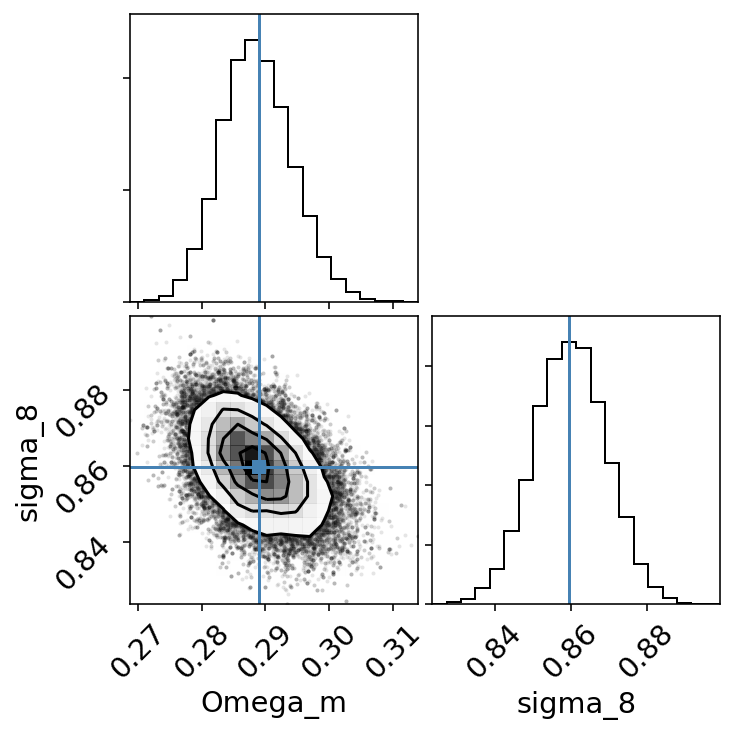

In [4]:
plot_chains('wp_c3h3_omegam_sigma8_covcomb')

<HDF5 dataset "chain": shape (24, 7600, 3), type "<f4">


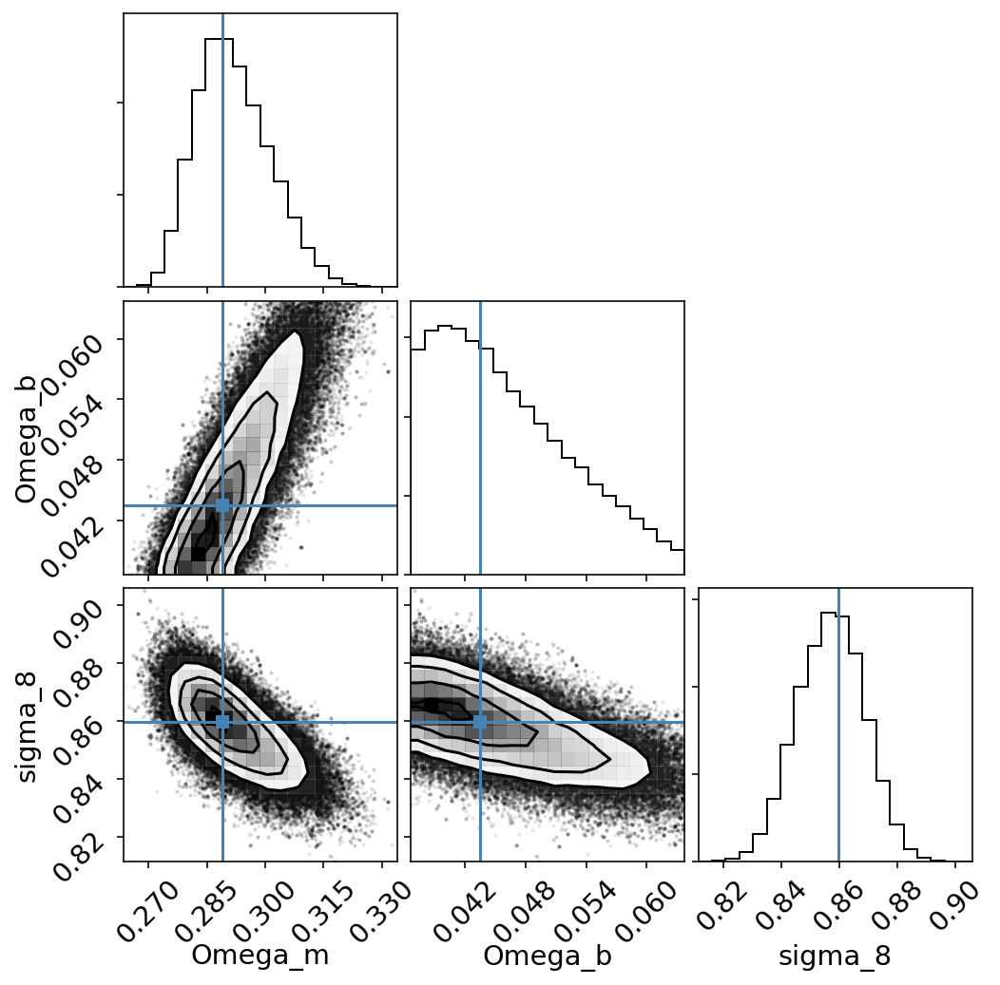

In [5]:
plot_chains('wp_c3h3_omegam_omegab_sigma8_covcomb', show_corner=True)

<HDF5 dataset "chain": shape (24, 8100, 4), type "<f4">


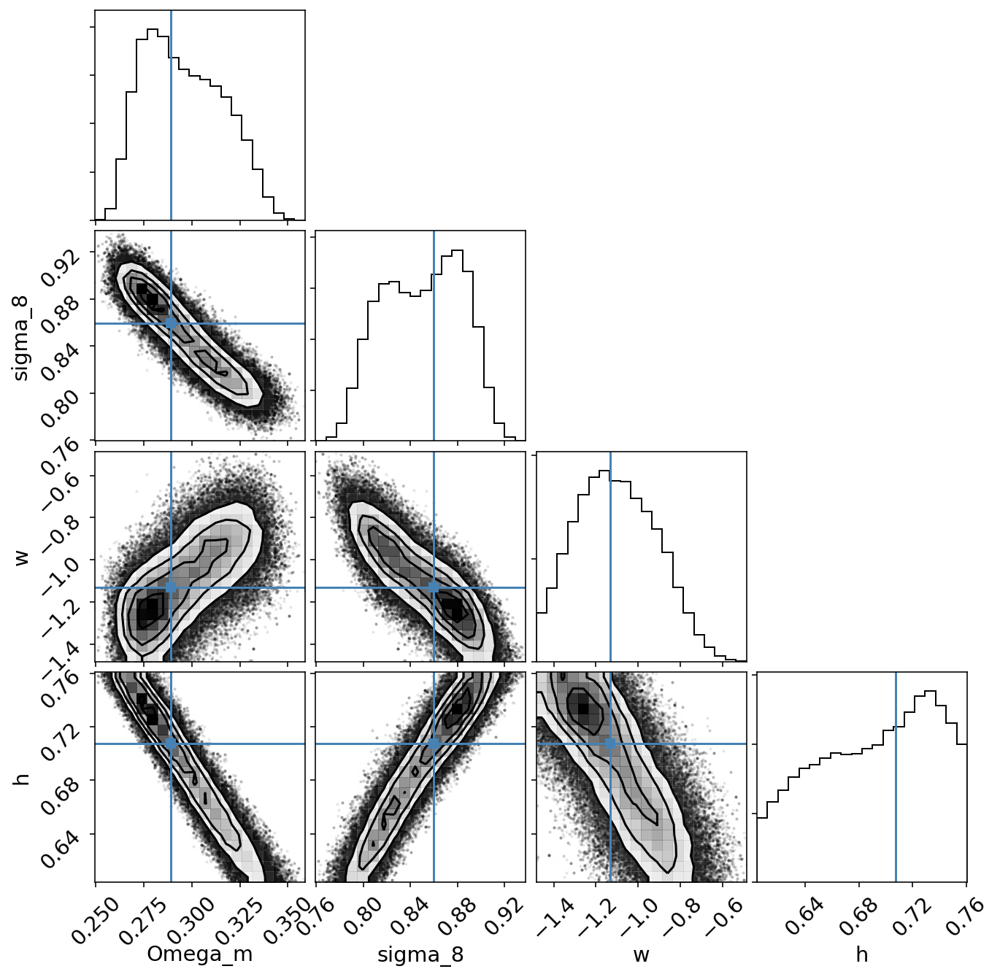

In [6]:
plot_chains('wp_c3h3_omegam_sigma8_w_h_covcomb')

<HDF5 dataset "chain": shape (24, 9200, 5), type "<f4">


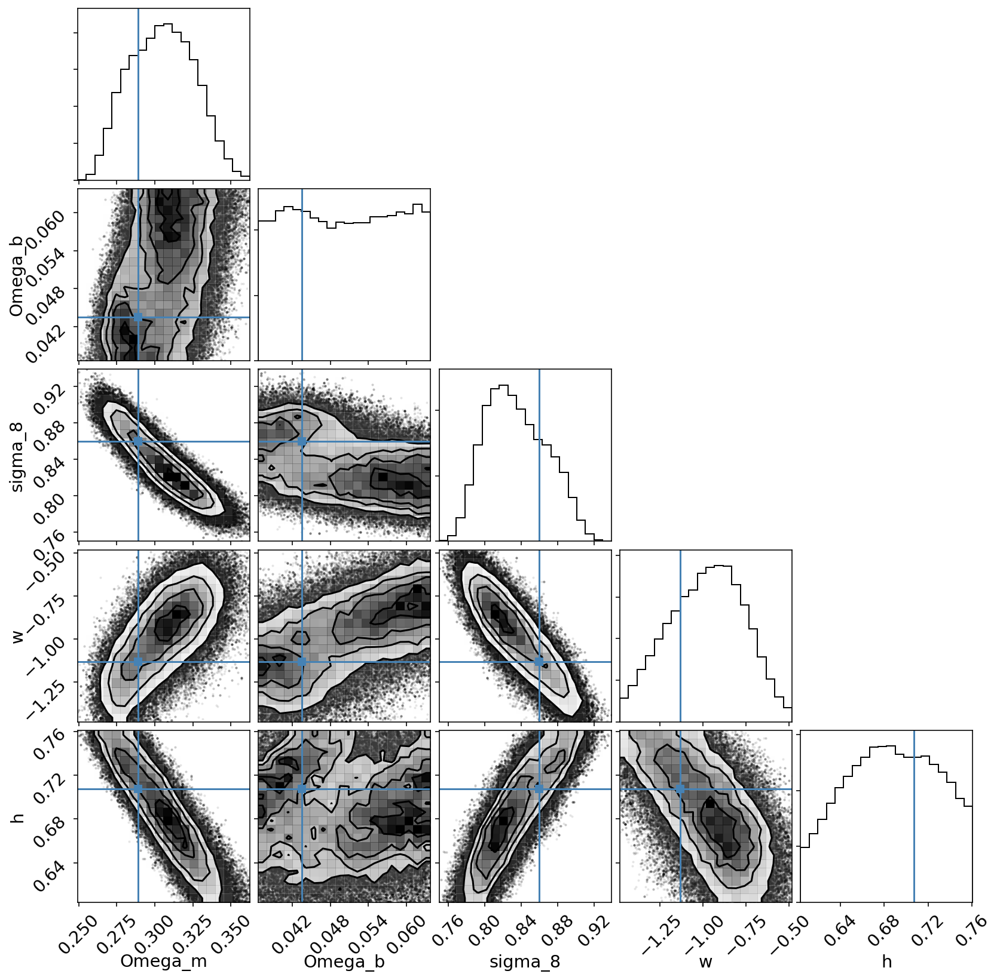

In [7]:
plot_chains('wp_c3h3_omegam_omegab_sigma8_w_h_covcomb', show_corner=True)

<HDF5 dataset "chain": shape (24, 10000, 7), type "<f4">


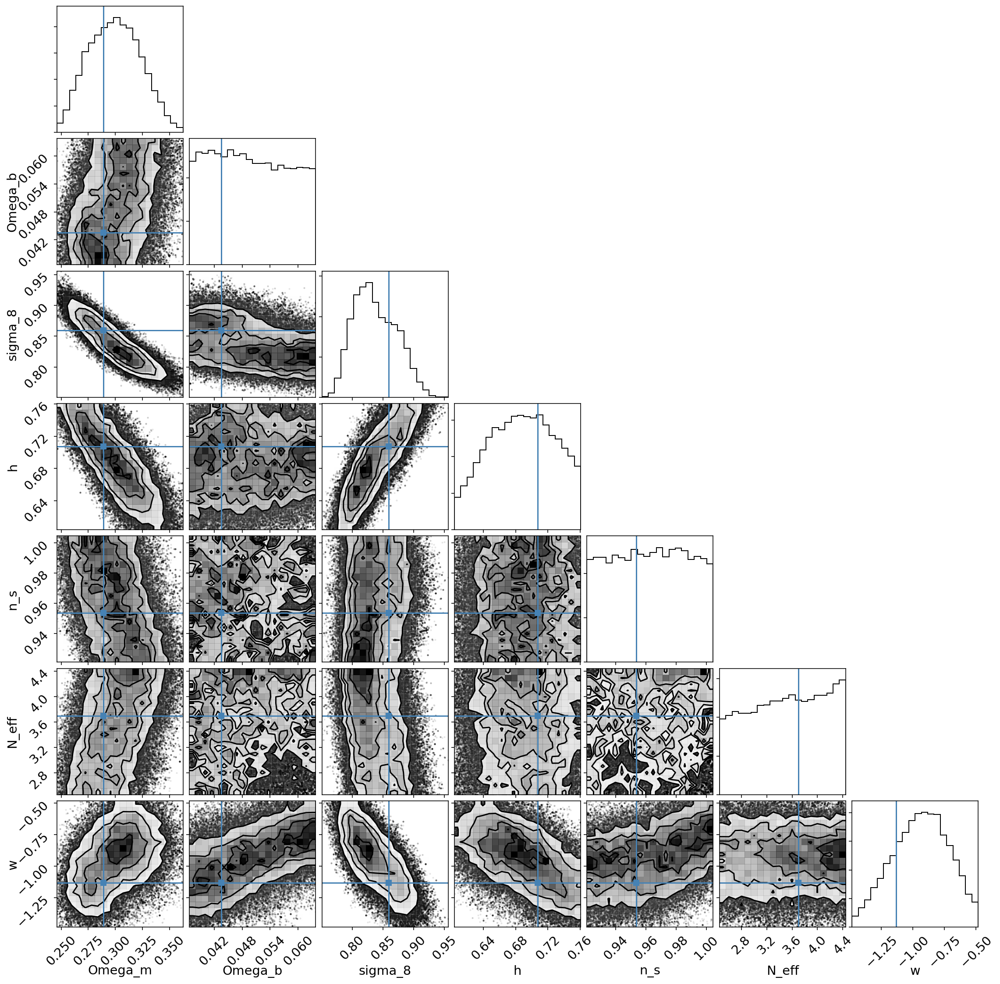

In [8]:
plot_chains('wp_c3h3_allcosmo_covcomb', show_corner=True)

<HDF5 dataset "chain": shape (24, 10000, 7), type "<f4">


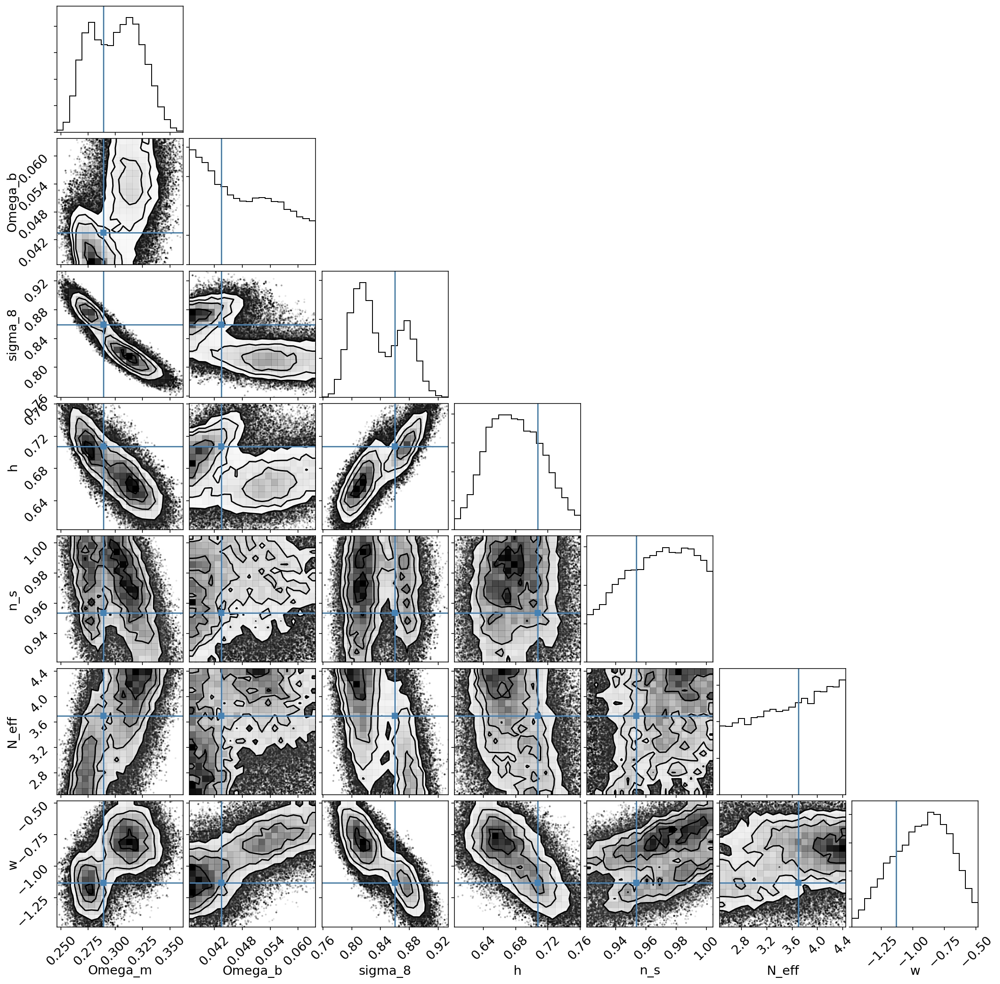

In [20]:
chaintag = 'wp_c3h3_allcosmo_xlong_diag'
plot_chains(chaintag, show_corner=True)

<HDF5 dataset "chain": shape (24, 10000, 7), type "<f4">


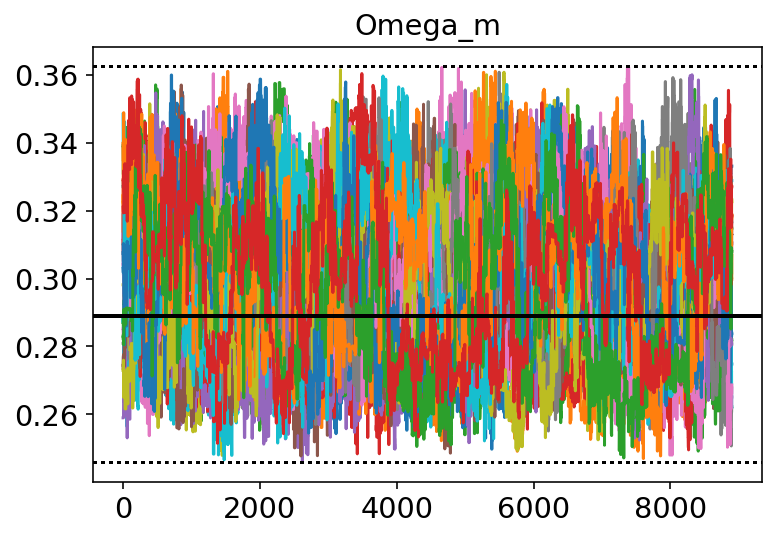

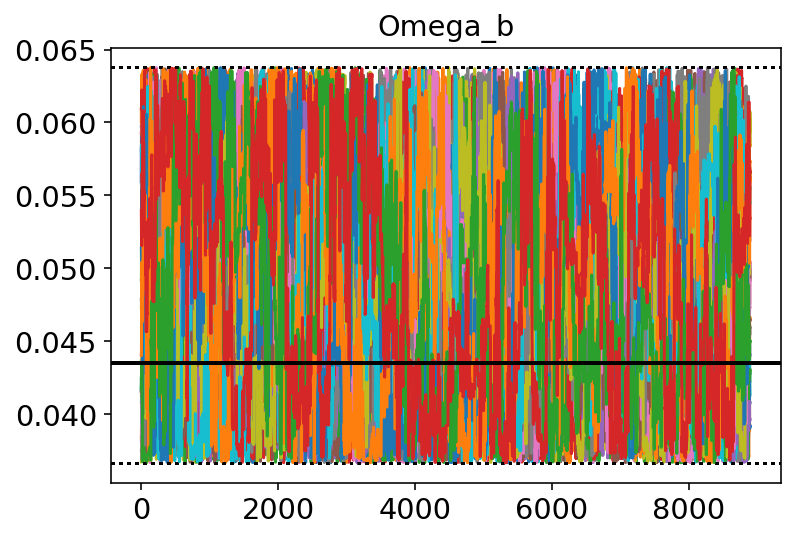

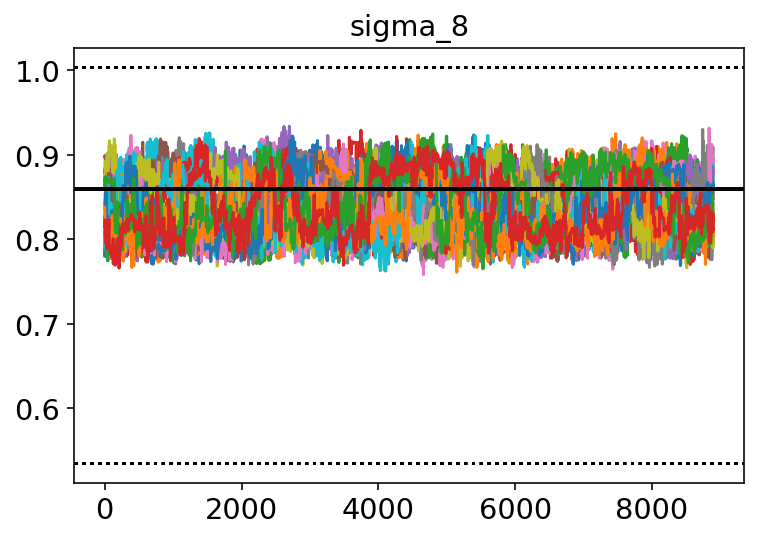

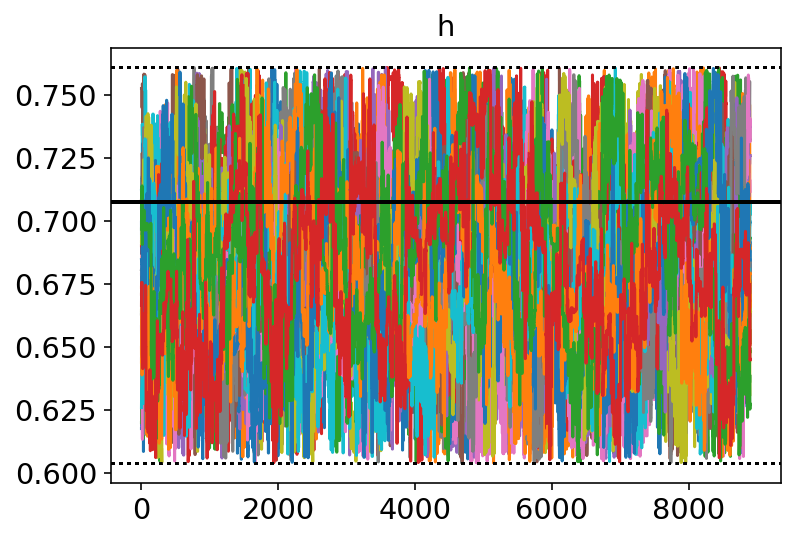

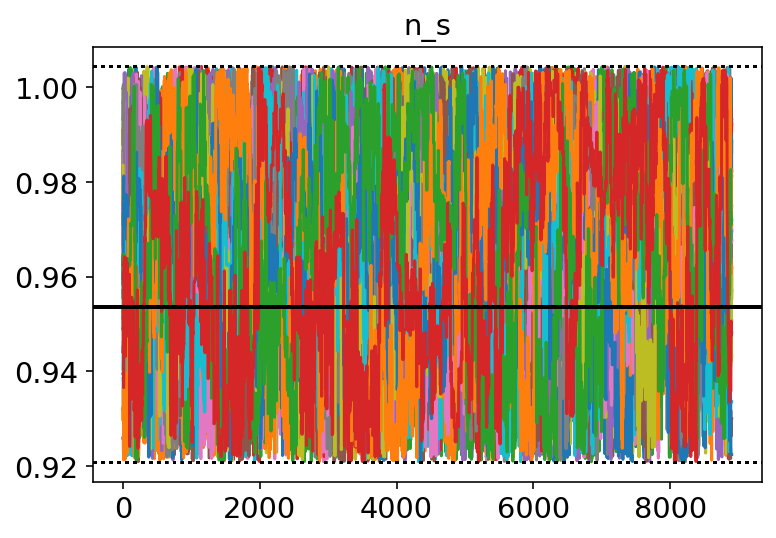

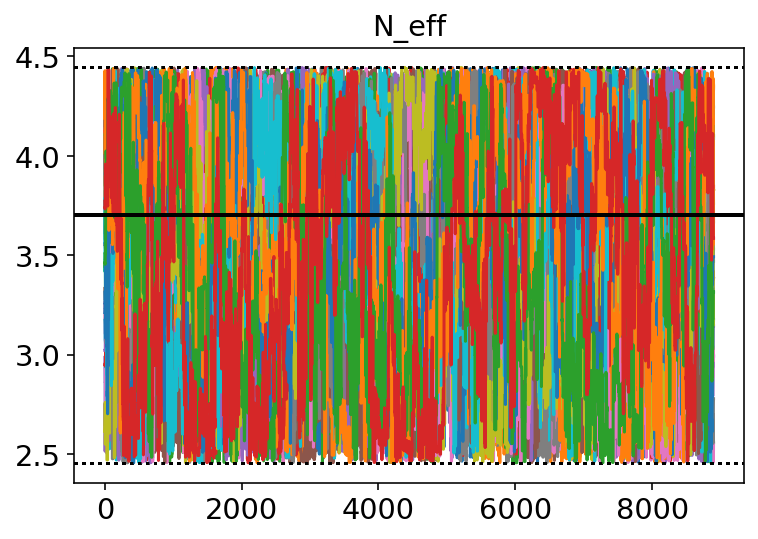

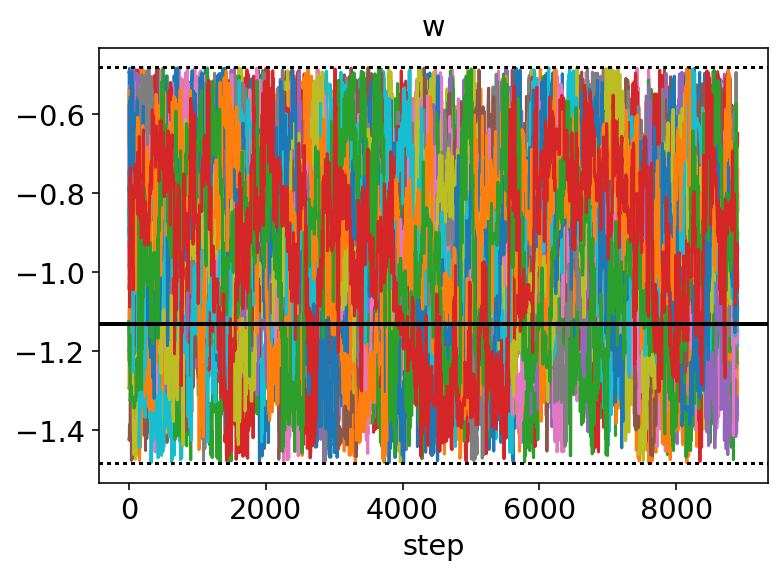

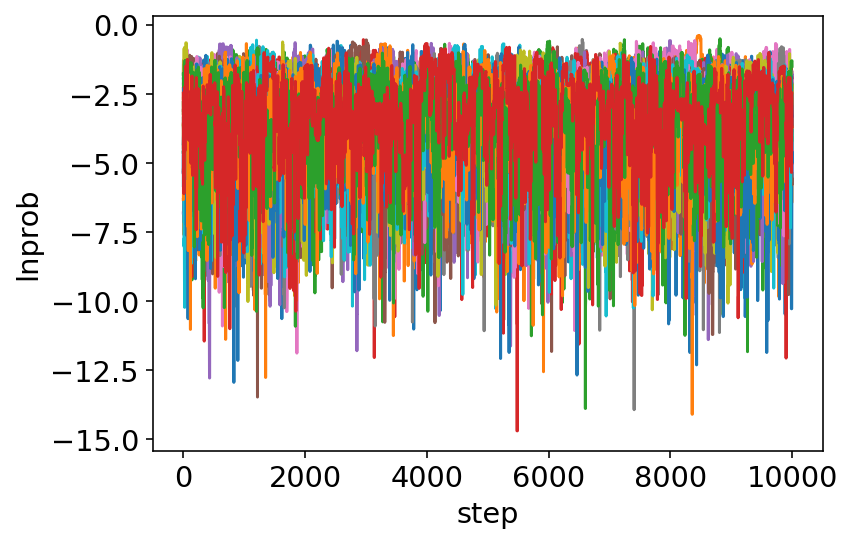

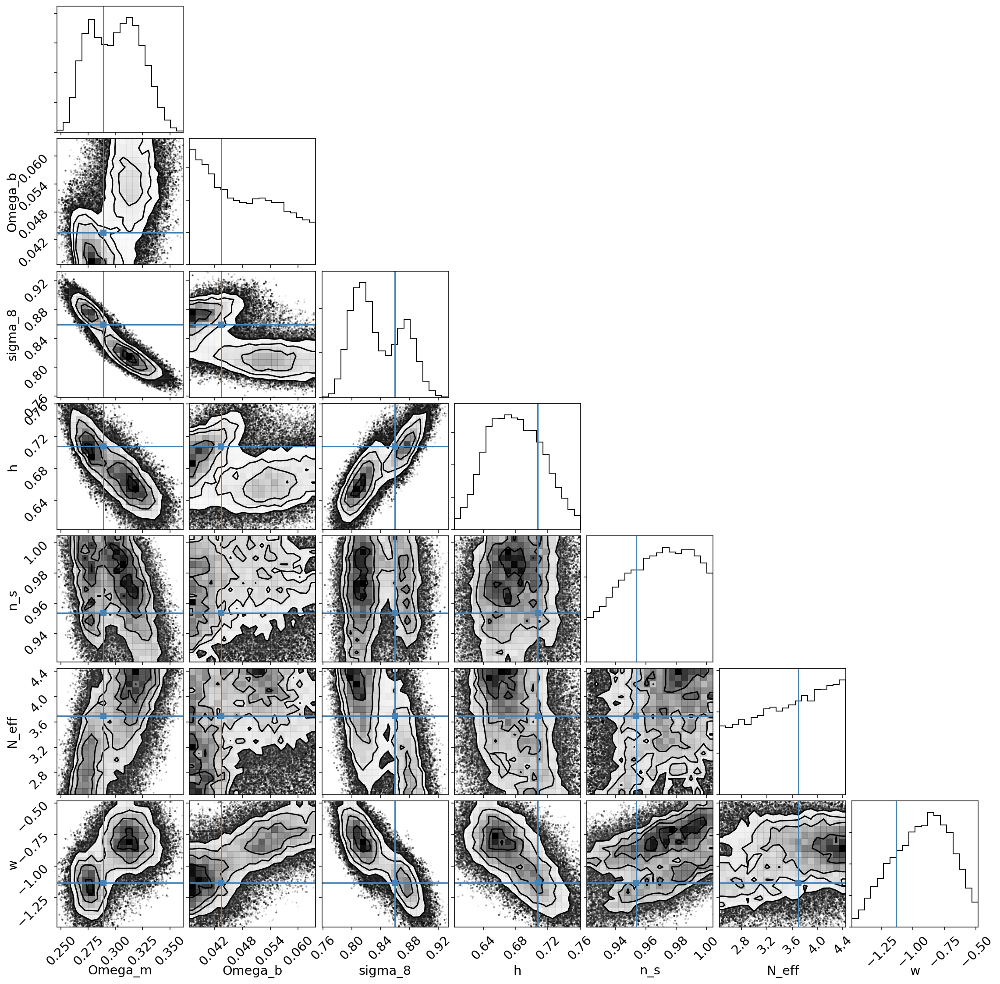

In [21]:
chaintag = 'wp_c3h3_allcosmo_xlong_diag'
chain_max = 8900

chain_fn = f'../chains/chains_{chaintag}.h5'
fw = h5py.File(chain_fn, 'r')

chain_dset = fw['chain']
print(chain_dset)
chain_dset = chain_dset[:,:chain_max,:]
lnprob_dset = fw['lnprob']
param_names = fw.attrs['param_names']
true_values = fw.attrs['true_values']
nwalkers, nchain, ndim = chain_dset.shape



for k in range(ndim):
    plt.figure()
    pname = param_names[k]
    for j in range(nwalkers):
        plt.title(pname)
        plt.plot(chain_dset[j,:,k], alpha=1)
        low, high = emu.get_param_bounds(pname)
        plt.axhline(low, ls=':', color='k')
        plt.axhline(high, ls=':', color='k')
        plt.axhline(true_values[k], ls='-', lw=2, color='k')
plt.xlabel('step')

plt.figure()
for j in range(nwalkers):
    plt.plot(lnprob_dset[j,:], alpha=1)
plt.ylabel('lnprob')
plt.xlabel('step')

chain = np.array(chain_dset)
fig = corner.corner(chain.reshape(-1, chain.shape[-1]), labels=param_names, truths=true_values)